# BC/Canada Covid-19 Predictions and Analysis

Background on dataset and problem
what you're gonna do
###### insights:
- will BC/Canada follow South korea's (or someone else) numbers
 - Look at day count and % of population infected

##### What the covid India analysis did:
Tasks to be performed:
- Analysing the present condition in India
- Is this trend similar to Italy/S. Korea/ Wuhan
- Exploring the world wide data
- Forecasting the world wide COVID-19 cases using Prophet

##### Novel Corona Virus 2019 Dataset github suggests:
Inspiration
Some insights could be

Changes in number of affected cases over time
Change in cases over time at country level
Latest number of affected cases

# To note in report: 
- not comparing china numbers much - due to high volume of cases in the beginning, strong data collection was not in place [source]
    - compared china a bit overall to give a general idea

In [3]:
import matplotlib

In [4]:
# sys.executable

In [5]:
# sys.path

In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import chart_studio.plotly as py

from datetime import datetime

%matplotlib inline

In [7]:
from plotly import __version__
import plotly.graph_objs as go 
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

print(__version__) # requires version >= 1.9.0
import cufflinks as cf
# For Notebooks
init_notebook_mode(connected=True)
# For offline use
cf.go_offline()

4.6.0


# Reading in global data for canada vs international below

###### Read in csv

In [8]:
# Daily number of confirmed cases, deaths, and recoveries globally
conf_g = pd.read_csv('csv_files/JH/time_series_covid19_confirmed_global.csv')
death_g = pd.read_csv('csv_files/JH/time_series_covid19_deaths_global.csv')
recov_g = pd.read_csv('csv_files/JH/time_series_covid19_recovered_global.csv')

# don't use your cleaned sheet, practice cleaning here: prov, prov_latlong, dfcan
# dfcan = pd.read_excel('csv_files/Canada Covid19 Clean.xlsx')

In [9]:
conf_g.sort_values(by=['Country/Region','Province/State'],inplace=True)
death_g.sort_values(by=['Country/Region','Province/State'],inplace=True)
recov_g.sort_values(by=['Country/Region','Province/State'],inplace=True)

Get global confirmed cases, deaths, and recovered into long table format

In [10]:
def long_format(old_df, kind):
    df = old_df.drop(['Lat','Long'],axis=1)
    df = df.set_index(['Province/State', 'Country/Region'])
    df = df.stack().to_frame()
    df.rename(columns={0:kind},inplace=True)
    df.reset_index(inplace=True)
    df.rename(columns={'level_2':'Date','Province/State':'Province','Country/Region':'Country'},inplace=True)
    df['Date'] = df['Date'].apply(lambda x: datetime.strptime(x, '%m/%d/%y'))
    df.set_index(['Province', 'Country','Date'],inplace=True)
    return df

In [11]:
cases_long = long_format(conf_g,'Cases')
deaths_long = long_format(death_g,'Deaths')
recovered_long = long_format(recov_g,'Recovered')

##### Combine cases, deaths, and recovered into 1 table: 
- recovered data does not specify numbers by Canadian province, therefore need to combine Canadian provinces in the confirmed cases and deaths, and only then can you combing these 3 tables)
- combine just confirmed cases and deaths in one table to have access to Canadian provinces

###### Global cases versus deaths over time (includes Canada broken down into provinces)

In [12]:
global_cases_vs_deaths = pd.concat([cases_long,deaths_long],axis=1)

global_cases_vs_deaths.reset_index(inplace=True)
global_cases_vs_deaths.head()

,Province,Country,Date,Cases,Deaths
0,NaN,Afghanistan,2020-01-22,0,0
1,NaN,Afghanistan,2020-01-23,0,0
2,NaN,Afghanistan,2020-01-24,0,0
3,NaN,Afghanistan,2020-01-25,0,0
4,NaN,Afghanistan,2020-01-26,0,0


###### Global cases, deaths, recovered over time (Canada is not broken down by province/territory)

Recovered data DOES NOT break down Canada into provinces, therefore to combine all confirmed cases, deaths, and recovery data for all countries, Canadian province data must be grouped into Canada as a whole for confirmed cases and deaths

In [13]:
def condense_canada(old_df):
    condense_can = old_df.copy()
    condense_can.reset_index(inplace=True)
    temp = condense_can[condense_can['Country']=='Canada'].groupby('Date').sum()
    temp['Country'] = 'Canada'
    temp['Province'] = float('NaN')
    temp.head()
    temp.reset_index(inplace=True)
    can_dropped = condense_can.set_index('Country').drop(index='Canada')
    can_dropped.reset_index(inplace=True)
    can_dropped = can_dropped.append(temp)
    can_dropped.sort_values(by=['Country','Province'],inplace=True)
    can_dropped.set_index(['Province','Country','Date'],inplace=True)
    return can_dropped

In [14]:
cases_no_can_provs = condense_canada(cases_long)
deaths_no_can_provs = condense_canada(deaths_long)

In [15]:
global_nums = pd.concat([cases_no_can_provs,deaths_no_can_provs,recovered_long],axis=1)

# global_nums.reset_index(inplace=True)
global_nums.head()

Cases  Deaths  Recovered
Province Country     Date                                
NaN      Afghanistan 2020-01-22      0       0          0
                     2020-01-23      0       0          0
                     2020-01-24      0       0          0
                     2020-01-25      0       0          0
                     2020-01-26      0       0          0

# Read in daily cases by country
Move up to top of file? 

In [16]:
# remove the ones you don't use!!!!!!!!!!!!

CAN_daily = pd.read_excel('csv_files/Canada International Daily.xlsx',sheet_name='Canada',parse_dates=True)
ITA_daily = pd.read_excel('csv_files/Canada International Daily.xlsx',sheet_name='Italy')
KOR_daily = pd.read_excel('csv_files/Canada International Daily.xlsx',sheet_name='South Korea')
SWE_daily = pd.read_excel('csv_files/Canada International Daily.xlsx',sheet_name='Sweden')
USA_daily = pd.read_excel('csv_files/Canada International Daily.xlsx',sheet_name='United States')
GBR_daily = pd.read_excel('csv_files/Canada International Daily.xlsx',sheet_name='United Kingdom')
CHN_daily = pd.read_excel('csv_files/Canada International Daily.xlsx',sheet_name='China')
CN_HB_daily = pd.read_excel('csv_files/Canada International Daily.xlsx',sheet_name='Hubei')

In [17]:
KOR_daily.head()
# type(CAN_daily['Date'].loc[0])

,Date,TotalCases,Days since 100th case
0,2020-01-22,1,0
1,2020-01-23,1,0
2,2020-01-24,2,0
3,2020-01-25,2,0
4,2020-01-26,3,0


Transform Johns Hopkins data to get Date and Province/State Columns for Canadian Provinces only
###### not sure if these tables are still used - check then delete

In [18]:
def can_provinces(transform_df):
    df = transform_df[transform_df['Country/Region'] =='Canada'].drop(['Lat','Long','Country/Region'],axis=1)
    df = df.transpose()
    df.columns = df.loc['Province/State']
    df.drop(['Province/State'],inplace=True)
    df.reset_index(inplace=True)
    df.rename(columns={'index':'Date'},inplace=True)
    df['Date'] = df['Date'].apply(lambda x: datetime.strptime(x, '%m/%d/%y'))
    return df

In [19]:
# Canadian dailyconfirmed cases, deaths, recovered by province (columns) and a date column

conf_time_can = can_provinces(conf_g)
death_time_can = can_provinces(death_g)
recov_time_can = can_provinces(recov_g)

conf_time_can.head()

Province/State,Date,Alberta,British Columbia,Diamond Princess,Grand Princess,Manitoba,New Brunswick,Newfoundland and Labrador,Northwest Territories,Nova Scotia,Ontario,Prince Edward Island,Quebec,Recovered,Saskatchewan,Yukon
0,2020-01-22,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,2020-01-23,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,2020-01-24,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,2020-01-25,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,2020-01-26,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


### Style for plots 

Pick fig size, background colours, colour scheme?

# Analyze data 

# Exploratory Data Analysis

#### Look at udemy course for more plots

.head .info and .describe

# Canadian Province Rates

In [20]:
province_daily = pd.read_csv('csv_files/CovidCanada/Provincial_Daily_Totals.csv')
# province_totals.rename(columns={'Province':'Province/Territory'},inplace=True)

# Get Province in title format
# a = province_daily.sort_values(['Province','Date'])

In [21]:
province_daily.head()

,SummaryDate,OBJECTID,Province,Abbreviation,DailyTotals,TotalCases,TotalRecovered,DailyRecovered,TotalDeaths,DailyDeaths,TotalTested,DailyTested,TotalActive,DailyActive,TotalHospitalized,DailyHospitalized,TotalICU,DailyICU
0,2020/01/25 12:00:00+00,1,ALBERTA,AB,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN
1,2020/01/25 12:00:00+00,2,NWT,NT,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN
2,2020/01/25 12:00:00+00,3,YUKON,YT,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN
3,2020/01/25 12:00:00+00,4,SASKATCHEWAN,SK,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN
4,2020/01/25 12:00:00+00,5,PEI,PE,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN


In [22]:
province_daily.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1590 entries, 0 to 1589
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   SummaryDate        1590 non-null   object 
 1   OBJECTID           1590 non-null   int64  
 2   Province           1590 non-null   object 
 3   Abbreviation       1590 non-null   object 
 4   DailyTotals        1590 non-null   int64  
 5   TotalCases         1590 non-null   int64  
 6   TotalRecovered     1590 non-null   int64  
 7   DailyRecovered     1590 non-null   int64  
 8   TotalDeaths        1590 non-null   int64  
 9   DailyDeaths        1590 non-null   int64  
 10  TotalTested        1590 non-null   int64  
 11  DailyTested        1590 non-null   int64  
 12  TotalActive        1590 non-null   int64  
 13  DailyActive        1582 non-null   float64
 14  TotalHospitalized  465 non-null    float64
 15  DailyHospitalized  465 non-null    float64
 16  TotalICU           465 n

Clean data: 
- Remove columns
- Convert Province values to title format
- Rename SummaryDate to "date"
- Convert "date" column to datetime format

In [23]:
province_daily.drop('OBJECTID',axis=1,inplace=True)
province_daily['Province'] = province_daily['Province'].apply(lambda x: x.title()) 
province_daily.rename(columns={'SummaryDate':'Date'},inplace=True)

province_daily['Date'] = province_daily['Date'].apply(lambda x: x[:10])
province_daily['Date'] = province_daily['Date'].apply(lambda x: datetime.strptime(x, '%Y/%m/%d'))

Check for unique values, replace values where appropriate 

In [24]:
province_daily['Province'].unique()

array(['Alberta', 'Nwt', 'Yukon', 'Saskatchewan', 'Pei', 'Ontario',
       'New Brunswick', 'Repatriated', 'Nova Scotia', 'Nl', 'Manitoba',
       'Bc', 'Nunavut', 'Quebec', 'Prince Edward Island',
       'Newfoundland And Labrador', 'British Columbia',
       'Northwest Territories', 'Repatriated Cdn', 'Canada'], dtype=object)

In [25]:
province_daily.loc[province_daily['Province'] == 'Nwt', 'Province'] = 'Northwest Territories'
province_daily.loc[province_daily['Province'] == 'Pei', 'Province'] = 'Prince Edward Island'
province_daily.loc[province_daily['Province'] == 'Bc', 'Province'] = 'British Columbia'
province_daily.loc[province_daily['Province'] == 'Nl', 'Province'] = 'Newfoundland And Labrador'
province_daily.loc[province_daily['Province'] == 'Repatriated Cdn', 'Province'] = 'Repatriated'

In [26]:
province_daily.head()

,Date,Province,Abbreviation,DailyTotals,TotalCases,TotalRecovered,DailyRecovered,TotalDeaths,DailyDeaths,TotalTested,DailyTested,TotalActive,DailyActive,TotalHospitalized,DailyHospitalized,TotalICU,DailyICU
0,2020-01-25,Alberta,AB,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN
1,2020-01-25,Northwest Territories,NT,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN
2,2020-01-25,Yukon,YT,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN
3,2020-01-25,Saskatchewan,SK,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN
4,2020-01-25,Prince Edward Island,PE,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN


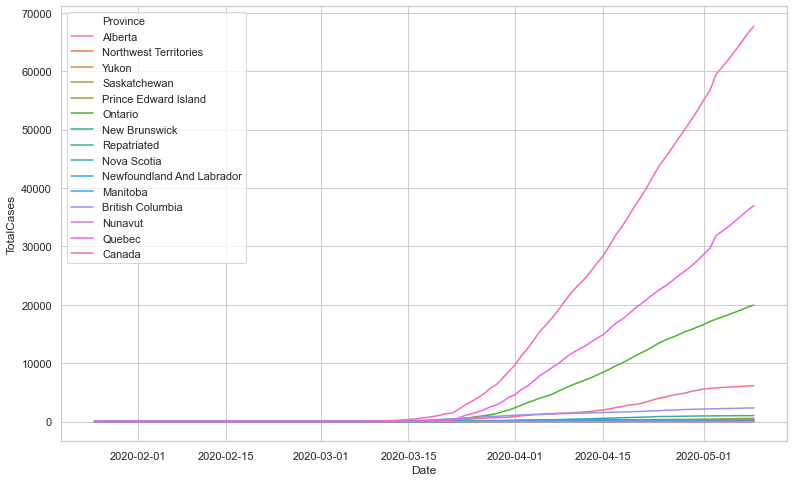

In [27]:
sns.set(style="whitegrid")
plt.figure(figsize=(13,8))
# sns.palplot(sns.color_palette("BuGn_r"))
sns.lineplot(x="Date", y="TotalCases",
             hue="Province", 
             data=province_daily
#              , palette="BuGn_r"
            )

#### Compare infection rate by population
Create population table

In [28]:
province_population = {'Alberta': 4413146, 'Northwest Territories':44904, 'Yukon':41078, 'Saskatchewan':1181666,
                                    'Prince Edward Island':158158, 'Ontario':14711827, 'New Brunswick':779993, 'Repatriated':float('inf'),
                                    'Nova Scotia': 977457, 'Newfoundland And Labrador':521365, 'Manitoba':1377517,
                                    'British Columbia':5110917, 'Nunavut':39097, 'Quebec':8537674, 'Canada':37894799}
province_population.values()

dict_values([4413146, 44904, 41078, 1181666, 158158, 14711827, 779993, inf, 977457, 521365, 1377517, 5110917, 39097, 8537674, 37894799])

In [29]:
province_population = {'Province': ['Alberta', 'Northwest Territories', 'Yukon', 'Saskatchewan', 'Prince Edward Island', 'Ontario', 'New Brunswick', 'Repatriated', 'Nova Scotia', 'Newfoundland And Labrador', 'Manitoba', 'British Columbia', 'Nunavut', 'Quebec', 'Canada'],
                       'Population': [4413146, 44904, 41078, 1181666, 158158, 14711827, 779993, None, 977457, 521365, 1377517, 5110917, 39097, 8537674, 37894799]}

In [30]:
province_population = pd.DataFrame(province_population)
province_population.head()

,Province,Population
0,Alberta,4413146.0
1,Northwest Territories,44904.0
2,Yukon,41078.0
3,Saskatchewan,1181666.0
4,Prince Edward Island,158158.0


In [31]:
province_population.set_index('Province',inplace=True)
province_daily.set_index('Province',inplace=True)

In [32]:
province_daily_pop = province_population.join(province_daily,on='Province')
province_daily_pop.head()

,Population,Date,Abbreviation,DailyTotals,TotalCases,TotalRecovered,DailyRecovered,TotalDeaths,DailyDeaths,TotalTested,DailyTested,TotalActive,DailyActive,TotalHospitalized,DailyHospitalized,TotalICU,DailyICU
Province,,,,,,,,,,,,,,,,,
Alberta,4413146.0,2020-01-25,AB,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN
Alberta,4413146.0,2020-01-26,AB,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN
Alberta,4413146.0,2020-01-27,AB,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN
Alberta,4413146.0,2020-01-28,AB,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN
Alberta,4413146.0,2020-01-29,AB,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,NaN


In [33]:
province_daily_pop.reset_index(inplace=True)
province_daily.reset_index(inplace=True)

In [34]:
type(province_daily_pop['TotalCases'].loc[0])
type(province_daily_pop['Population'].loc[0])

numpy.float64

In [35]:
province_daily_pop['TotalCases by population'] = province_daily_pop['TotalCases'].div(province_daily_pop['Population'])
province_daily_pop['TotalDeaths by population'] = province_daily_pop['TotalDeaths'].div(province_daily_pop['Population'])
province_daily_pop['TotalRecovered by population'] = province_daily_pop['TotalRecovered'].div(province_daily_pop['Population'])


province_daily_pop[province_daily_pop['Province'] == 'Quebec'].tail()

,Province,Population,Date,Abbreviation,DailyTotals,TotalCases,TotalRecovered,DailyRecovered,TotalDeaths,DailyDeaths,...,DailyTested,TotalActive,DailyActive,TotalHospitalized,DailyHospitalized,TotalICU,DailyICU,TotalCases by population,TotalDeaths by population,TotalRecovered by population
1479,Quebec,8537674.0,2020-05-05,QC,794,33417,7923,345,2398,118,...,4189,23096,331.0,1821.0,49.0,218.0,0.0,0.003914,0.000281,0.000928
1480,Quebec,8537674.0,2020-05-06,QC,910,34327,8284,361,2510,112,...,11568,23533,437.0,1840.0,19.0,213.0,-5.0,0.004021,0.000294,0.000970
1481,Quebec,8537674.0,2020-05-07,QC,911,35238,8673,389,2631,121,...,9212,23934,401.0,1836.0,-4.0,224.0,11.0,0.004127,0.000308,0.001016
1482,Quebec,8537674.0,2020-05-08,QC,912,36150,8928,255,2725,94,...,6776,24497,563.0,1827.0,-9.0,207.0,-17.0,0.004234,0.000319,0.001046
1483,Quebec,8537674.0,2020-05-09,QC,836,36986,9268,340,2786,61,...,10451,24932,435.0,1835.0,8.0,205.0,-2.0,0.004332,0.000326,0.001086


Repatriated and Canada are not included in this graph

In [36]:
province_daily_pop.set_index('Province',inplace=True)

In [37]:
province_daily_pop.drop(['Canada','Repatriated'],inplace=True)

In [38]:
province_daily_pop.reset_index(inplace=True)

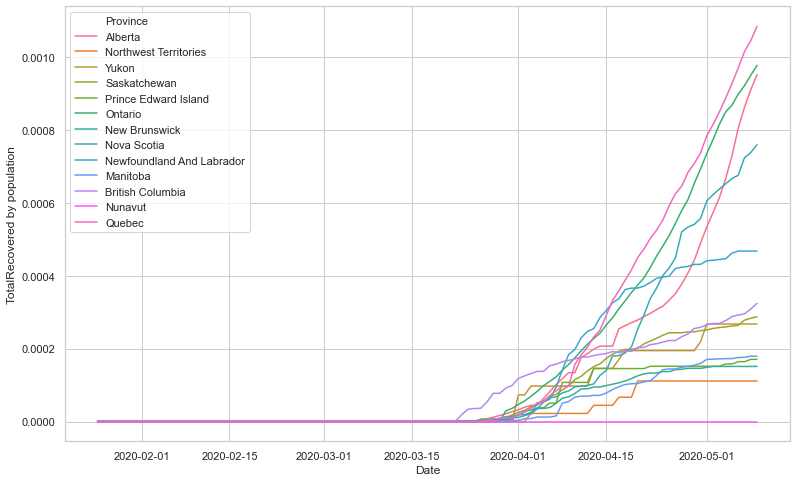

In [39]:
sns.set(style="whitegrid")
plt.figure(figsize=(13,8))
# sns.palplot(sns.color_palette("BuGn_r"))
sns.lineplot(x="Date", y="TotalRecovered by population",
             hue="Province", 
             data=province_daily_pop
#              , palette="BuGn_r"
            )

In [40]:
province_daily_pop.rename(columns={'TotalCases by population':'TotalCasesPop'},inplace=True)

In [41]:
traces=[]

for x, geo_region in province_daily_pop.groupby('Province'):

    traces.append(go.Scatter(x=geo_region.Date, y=geo_region.TotalCasesPop, name=x, mode='lines'))

fig = go.Figure(data=traces)
iplot(fig)

#### Create dataframe to hold province totals

In [42]:
# Grab province numbers from May 4th, 2020
province_totals = province_daily.loc[range(1500,1514)]

In [43]:
# Remove daily totals as they don't make sense in this context
province_totals.drop(['DailyTotals','DailyRecovered','DailyDeaths','DailyTested','DailyActive','DailyHospitalized','DailyICU',],axis=1,inplace=True)

In [44]:
province_totals.head()

,Province,Date,Abbreviation,TotalCases,TotalRecovered,TotalDeaths,TotalTested,TotalActive,TotalHospitalized,TotalICU
1500,Nunavut,2020-05-04,NU,0,0,0,703,0,0.0,0.0
1501,Yukon,2020-05-04,YT,11,11,0,1028,0,0.0,0.0
1502,Prince Edward Island,2020-05-04,PE,27,25,0,3387,2,0.0,0.0
1503,Newfoundland And Labrador,2020-05-04,NL,259,233,3,8961,23,4.0,2.0
1504,New Brunswick,2020-05-04,NB,118,118,0,15585,0,0.0,0.0


In [45]:
province_totals.style.background_gradient(cmap='Greens')

,Province,Date,Abbreviation,TotalCases,TotalRecovered,TotalDeaths,TotalTested,TotalActive,TotalHospitalized,TotalICU
1500,Nunavut,2020-05-04 00:00:00,NU,0,0,0,703,0,0.000000,0.000000
1501,Yukon,2020-05-04 00:00:00,YT,11,11,0,1028,0,0.000000,0.000000
1502,Prince Edward Island,2020-05-04 00:00:00,PE,27,25,0,3387,2,0.000000,0.000000
1503,Newfoundland And Labrador,2020-05-04 00:00:00,NL,259,233,3,8961,23,4.000000,2.000000
1504,New Brunswick,2020-05-04 00:00:00,NB,118,118,0,15585,0,0.000000,0.000000
1505,British Columbia,2020-05-04 00:00:00,BC,2224,1417,117,96517,690,77.000000,20.000000
1506,Nova Scotia,2020-05-04 00:00:00,NS,985,638,38,31426,309,6.000000,2.000000
1507,Saskatchewan,2020-05-04 00:00:00,SK,467,307,6,32334,154,7.000000,4.000000
1508,Alberta,2020-05-04 00:00:00,AB,5836,2942,104,164722,2790,89.000000,21.000000
1509,Manitoba,2020-05-04 00:00:00,MB,281,238,6,27446,37,5.000000,0.000000


In [46]:
total_cases_in_canada = province_totals['TotalCases'].sum()
total_deaths_in_canada = province_totals['TotalDeaths'].sum()
total_recovered_in_canada = province_totals['TotalRecovered'].sum()

print('Total confirmed cases in Canada as of May 4th, 2020:',total_cases_in_canada)
print('Total deaths in Canada as of May 4th, 2020:',total_deaths_in_canada)
print('Total recovered in Canada as of May 4th, 2020:',total_recovered_in_canada)

Total confirmed cases in Canada as of May 4th, 2020: 60772
Total deaths in Canada as of May 4th, 2020: 3854
Total recovered in Canada as of May 4th, 2020: 26030


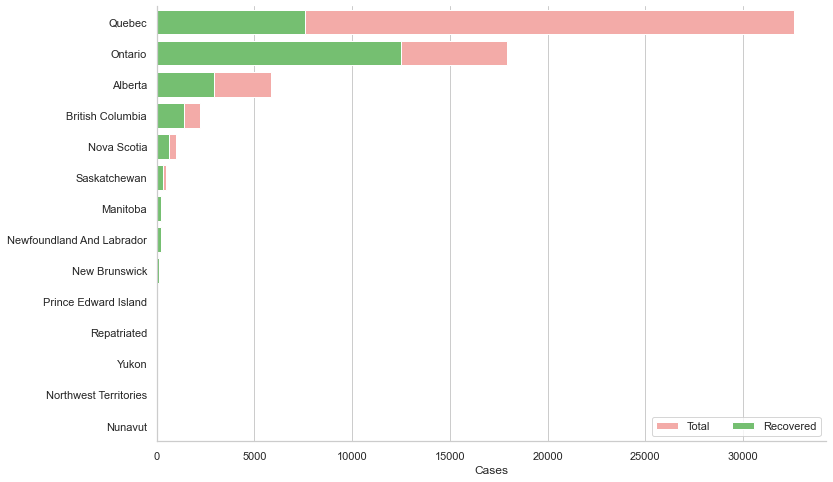

In [47]:
#Learn how to use Seaborn for visualization
fig, ax = plt.subplots(figsize=(12, 8))
data = province_totals[['Province','TotalCases','TotalRecovered','TotalDeaths']]
data.sort_values('TotalCases',ascending=False,inplace=True)
sns.set_color_codes("pastel")
sns.barplot(x="TotalCases", y="Province", data=data,label="Total", color="r")

sns.set_color_codes("muted")
sns.barplot(x="TotalRecovered", y="Province", data=data, label="Recovered", color="g")

# Add a legend and informative axis label
ax.legend(ncol=2, loc="lower right", frameon=True)

# I changed this slightly
ax.set( ylabel="",xlabel="Cases")
sns.despine(right=True, top=True)

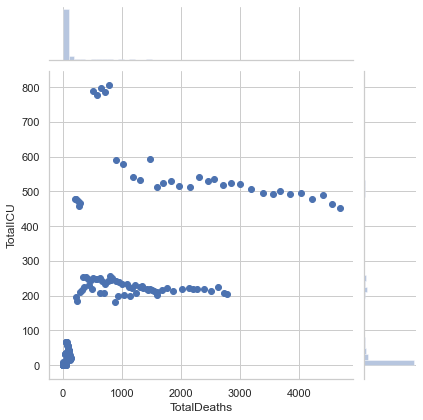

In [48]:
sns.jointplot(data=province_daily,x='TotalDeaths',y='TotalICU')

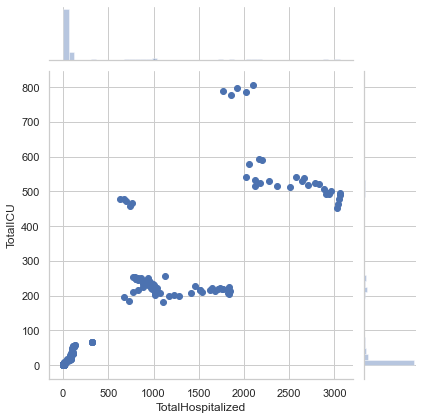

In [49]:
sns.jointplot(data=province_daily,x='TotalHospitalized',y='TotalICU')

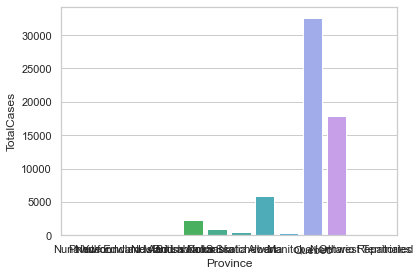

In [50]:
sns.barplot('Province','TotalCases',data=province_totals)
# province_totals.iplot(kind='bar',x='Province',y='TotalCases')

plt.tight_layout()
plt.show()

# Quebec
- make the 4 subplots
 - use age, sex, deaths, confirmed, hosp from the qb_cleaned

#### Find stuff like this??

**Visualization Inference:** 
* Manipur and Mizoram reports thier first case. 
* Kerela has crossed Maharashtra in terms of highest number of confirmed cases.
* Haryana and Telengana has the highest count of confirmed Foreign National count.
* Till 25th of March 9 people have died in India
* Kerala, Maharashtra, and karnataka are currently TOP 3 states with maximum number of confirmed cases

#### Exploratory data analysis (still canada provinces)

###### Interactive map

###### Get GeoJSON from Stats Canada Census

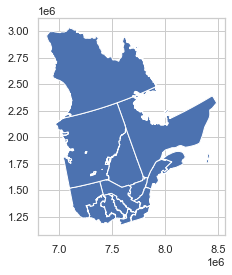

In [51]:
import geopandas as gpd
# from matplotlib import descartes
fp = 'csv_files/Quebec/HR_024a18a_e.shx'
map_df = gpd.read_file(fp)
# check data type so we can see that this is not a normal dataframe, but a GEOdataframe

map_df.plot()

In [52]:
qb_health_regions = pd.read_csv('csv_files/Quebec/qb_cases_health_region.csv')
qb_health_regions

,Category,Taux pour 100 000
0,Nord-du-Québec,59.005753
1,Gaspésie – Îles-de-la-Madeleine,188.893087
2,Chaudière-Appalaches,95.512759
3,Laval,835.921354
4,Lanaudière,501.065196
5,Laurentides,252.963469
6,Montérégie,291.676642
7,Nunavik,140.252454
8,Terres-Cries-de-la-Baie-James,54.392168
9,Bas-Saint-Laurent,18.267250


In [53]:
categories = ['Bas-Saint-Laurent','Saguenay – Lac-Saint-Jean','Capitale-Nationale','Mauricie et Centre-du-Québec',
     'Estrie','Montréal','Outaouais','Abitibi-Témiscamingue','Côte-Nord','Nord-du-Québec',
     'Gaspésie – Îles-de-la-Madeleine','Chaudière-Appalaches','Laval','Lanaudière','Laurentides',
    'Montérégie','Nunavik','Terres-Cries-de-la-Baie-James']
map_df['Category'] = categories

In [54]:
merged = map_df.set_index('Category').join(qb_health_regions.set_index('Category'))
merged.reset_index(inplace=True)
merged.head()

,Category,geometry,Taux pour 100 000
0,Bas-Saint-Laurent,"POLYGON ((7983960.509 1783925.871, 7985523.191...",18.267250
1,Saguenay – Lac-Saint-Jean,"POLYGON ((7633344.703 2074566.791, 7635455.789...",107.696519
2,Capitale-Nationale,"POLYGON ((7811516.777 1616612.783, 7813390.280...",130.516679
3,Mauricie et Centre-du-Québec,"POLYGON ((7459301.751 1597664.723, 7459403.646...",270.321495
4,Estrie,"POLYGON ((7854287.706 1351074.386, 7854803.251...",177.831670


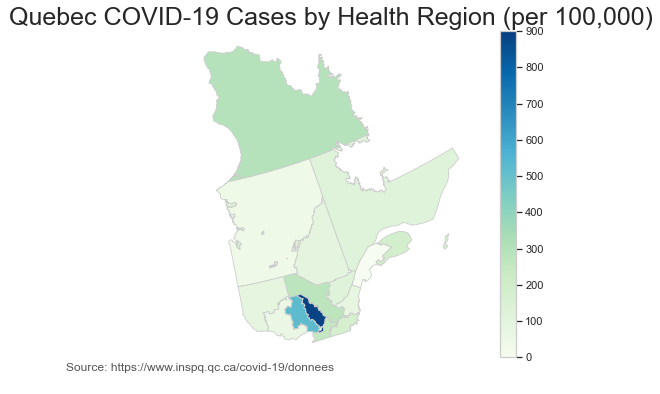

In [55]:
# set the range for the choropleth
vmin, vmax = 120, 220
# create figure and axes for Matplotlib
fig, ax = plt.subplots(1, figsize=(10, 6))

# create map - uses matplotlib, geopandas - specifying column makes it a choropleth map
# merged.plot(column='Taux pour 100 000', cmap='OrRd', ax=ax,linewidth=0.8, edgecolor='0.8')
merged.plot(column='Taux pour 100 000', cmap='GnBu', ax=ax,linewidth=0.8, edgecolor='0.8')
ax.axis('off')

# OrRd GnBu GnBu_r Greens_r

# add a title
ax.set_title('Quebec COVID-19 Cases by Health Region (per 100,000)', fontdict={'fontsize': '25', 'fontweight' : '3'})

# create an annotation for the data source
ax.annotate('Source: https://www.inspq.qc.ca/covid-19/donnees',xy=(0.1, .08),  xycoords='figure fraction', horizontalalignment='left', verticalalignment='top', fontsize=12, color='#555555')

# Create colorbar as a legend
sm = plt.cm.ScalarMappable(cmap='GnBu', norm=plt.Normalize(vmin=0, vmax=900))

# empty array for the data range
sm._A = []

# add the colorbar to the figure
cbar = fig.colorbar(sm)

# fig.savefig(“map_export.png”, dpi=300)

Based on the map above, we can observe that the majority of cases in Quebec come from Montreal, Laval, and Lanaudière, which makes sense as Monreal contains a major airport for national and international travel, with many flights coming from New York, one of the biggest COVID-19 hotspots in the world, and due to Quebec's close proximity to the United States, center to the majority of the world's COVID-19 cases. 

and its surrounding areas are known for tourism. As more tourists come in and out of Montreal, the risk of COVID-19 being spread increases with each visitor. 

After some research, the high amount of cases can also be attributed to retirees who spent their winter in warmer places. After the announcement of the pandemic and many flights getting cancelled, many of these people returned to Canada, aware they needed to self-isolate for 14 days. However, as few of them had any food or supplies remaining at their homes, several people went to local supermarkets to stock up before going into quarantine, causing a sharp rise in cases. <_ source _> <put this next to a line or bar graph>
    https://www.cbc.ca/news/canada/montreal/snowbirds-scrambling-to-return-to-quebec-1.5502182
    https://nationalpost.com/news/local-news/coronavirus-rv-driving-snowbird-expelled-from-two-quebec-grocery-stores/wcm/1d226434-8655-4625-8098-72fa0a6be4d5
    
Another cause for Quebec's high infection rate was delaying the shutdown of schools. The province's spring break took place from March 1st until March 6th, and as far as most people knew at the end of February, the coronavirus was mostly affecting Asian countries, Italy, and Northern Italy. However, soon after Quebec's spring break had started, Florida declared a state of emergency, with New York soon following. Quebec students returned to schools March 9th, however as the World Health Organization declared a global pandemic on March 11th, Quebec shutdown schools and recommended against non-essential travel on March 13th. It is likely that Quebec's early spring break could have been a factor in the province's high infection rate, as other provinces such as British Columbia shutdown schools before their spring break, enduring far fewer cases of coronavirus. [https://www.theglobeandmail.com/canada/article-why-quebecs-coronavirus-cases-have-skyrocketed/]


#### add thoughts on Quebec reopening !!!!!!!!!!!! ************

I will be analyzing Quebec and British Columnbia in this case study. Quebec has _% of Canada's population yet it also has the highest number of coronavirus cases in the country. Through this analysis I hope to ___ and predict the infection rate for Quebec cases.

I will also briefly look at British Columbia, as it initially had the most cases in Canada on March __ but since then, the province has had a tremendous decrease in cases, currently sitting at just over 2200 cases as of May 4th. By comparing the early part of BC's case rate, we might be able to make some inferences from that

In [56]:
canada_deaths = pd.read_csv('https://raw.githubusercontent.com/ishaberry/Covid19Canada/master/mortality.csv')
canada_deaths.head()

,death_id,province_death_id,case_id,age,sex,health_region,province,country,date_death_report,death_source,additional_info,additional_source
0,1,1,60.0,80-89,Male,Vancouver Coastal,BC,Canada,08-03-2020,https://news.gov.bc.ca/releases/2020HLTH0068-0...,Lynn Valley Resident,NaN
1,2,1,477.0,70-79,Male,Simcoe Muskoka,Ontario,Canada,11-03-2020,https://www.nationalobserver.com/2020/03/17/ne...,Was being treated at Royal Victoria Regional H...,NaN
2,3,2,NaN,Not Reported,Not Reported,Vancouver Coastal,BC,Canada,16-03-2020,https://news.gov.bc.ca/releases/2020HLTH0086-0...,Lynn Valley Resident,NaN
3,4,3,NaN,Not Reported,Not Reported,Vancouver Coastal,BC,Canada,16-03-2020,https://news.gov.bc.ca/releases/2020HLTH0086-0...,Lynn Valley Resident,NaN
4,5,4,NaN,Not Reported,Not Reported,Vancouver Coastal,BC,Canada,16-03-2020,https://news.gov.bc.ca/releases/2020HLTH0086-0...,Lynn Valley Resident,NaN


In [57]:
# fig = px.choropleth(df, geojson=counties, locations='fips', color='unemp',
#                            color_continuous_scale="Viridis",
#                            range_color=(0, 12),
#                            scope="usa",
#                            labels={'unemp':'unemployment rate'}
#                           )
# fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
# fig.show()

In [58]:
fig = go.Figure(go.Scattergeo())
fig.update_geos(
    visible=False, resolution=50, scope="north america",
    showcountries=True, countrycolor="Black",
    showsubunits=True, subunitcolor="Blue"
)
fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [59]:
# import plotly.express as px

# fig = px.scatter_mapbox(
#     dfcan, lat="Latitude", lon="Longitude", size="TotalCases", # color="type",
#     hover_name='Province/Territory', hover_data=['TotalCases'], zoom=2, size_max=50)
# fig.update_layout(mapbox_style="open-street-map")

# fig.show()

Confirmed vs recovered (India tutorial)  

###### --> this was copy pasted exactly!!!!!!!!!!!!

jointplot to compare 2 features (do many times)

In [60]:
# a = 
# conf_time.set_index('Date').iplot(xTitle="Date",yTitle="Confirmed Cases", title="Number of Confirmed Covid-19 Cases by Canadian Province/Territory")

# Canada vs. International
- infection rate
- infection rate after 100th case
- infection rate after 500th case

In [61]:
# conf_time.set_index('Date').iplot(xTitle="Date",yTitle="Confirmed Cases", title="Number of Confirmed Covid-19 Cases by Canadian Province/Territory")

In [62]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [63]:
fig = go.Figure()
# Create and style traces
fig.add_trace(go.Scatter(x=CAN_daily['Date'], y=CAN_daily['TotalCases'], name='CAN',
                         line=dict(color='firebrick', width=4) # ,mode='lines+markers'
                        ))
fig.add_trace(go.Scatter(x=SWE_daily['Date'], y=SWE_daily['TotalCases'], name = 'SWE',
                         line=dict(color='royalblue', width=4)))
fig.add_trace(go.Scatter(x=KOR_daily['Date'], y=KOR_daily['TotalCases'], name='KOR',
                         line=dict(color='orange', width=4)))
fig.add_trace(go.Scatter(x=GBR_daily['Date'], y=GBR_daily['TotalCases'], name = 'GBR',
                         line=dict(color='green', width=4)))
fig.add_trace(go.Scatter(x=ITA_daily['Date'], y=ITA_daily['TotalCases'], name='ITA',
                         line=dict(color='yellow', width=4)))

fig.add_trace(go.Scatter(x=USA_daily['Date'], y=USA_daily['TotalCases'], name = 'USA',
                         line=dict(color='blue', width=4)))
fig.add_trace(go.Scatter(x=CHN_daily['Date'], y=CHN_daily['TotalCases'], name = 'CHN',
                         line=dict(color='black', width=4)))
fig.add_trace(go.Scatter(x=CN_HB_daily['Date'], y=CN_HB_daily['TotalCases'], name = 'CN_HB',
                         line=dict(color='pink', width=4)))

# Edit the layout
fig.update_layout(title='Total Confirmed Covid-19 Cases (International)',
                   xaxis_title='Date',
                   yaxis_title='Number of Cases')


fig.show()

In [64]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=CAN_daily['Days since 100th case'], y=CAN_daily['TotalCases'], name='CAN',
                         line=dict(color='firebrick', width=4) # dash options include 'dash', 'dot', and 'dashdot'
))
fig.add_trace(go.Scatter(x=SWE_daily['Days since 100th case'], y=SWE_daily['TotalCases'], name='SWE',
                         line = dict(color='royalblue', width=4)))
fig.add_trace(go.Scatter(x=KOR_daily['Days since 100th case'], y=KOR_daily['TotalCases'], name='KOR',
                         line=dict(color='orange', width=4)))
fig.add_trace(go.Scatter(x=GBR_daily['Days since 100th case'], y=GBR_daily['TotalCases'], name = 'GBR',
                         line=dict(color='green', width=4)))
fig.add_trace(go.Scatter(x=ITA_daily['Days since 100th case'], y=ITA_daily['TotalCases'], name='ITA',
                         line=dict(color='yellow', width=4)))

fig.add_trace(go.Scatter(x=USA_daily['Days since 100th case'], y=USA_daily['TotalCases'], name = 'USA',
                         line=dict(color='purple', width=4)))

fig.add_trace(go.Scatter(x=CHN_daily['Days since 100th case'], y=CHN_daily['TotalCases'], name = 'CHN',
                         line=dict(color='black', width=4)))
fig.add_trace(go.Scatter(x=CN_HB_daily['Days since 100th case'], y=CN_HB_daily['TotalCases'], name = 'CN_HB',
                         line=dict(color='pink', width=4)))

# Edit the layout
fig.update_layout(title='Infection Rate after 100th Case',
                   xaxis_title='Number of days since 100th reported case',
                   yaxis_title='Number of cases - or reported cases per 1M')

fig.show()

In [65]:
log_days_after_500 = pd.read_csv('csv_files/International/Countries log Days since 500th Case.csv')
log_days_after_500.head()

fig = go.Figure()

fig.add_trace(go.Scatter(x=CAN_daily['Days since 100th case'], y=CAN_daily['TotalCases'], name='CAN',
                         line=dict(color='firebrick', width=4) # dash options include 'dash', 'dot', and 'dashdot'
))
fig.add_trace(go.Scatter(x=SWE_daily['Days since 100th case'], y=SWE_daily['TotalCases'], name='SWE',
                         line = dict(color='royalblue', width=4)))
fig.add_trace(go.Scatter(x=KOR_daily['Days since 100th case'], y=KOR_daily['TotalCases'], name='KOR',
                         line=dict(color='orange', width=4)))
fig.add_trace(go.Scatter(x=GBR_daily['Days since 100th case'], y=GBR_daily['TotalCases'], name = 'GBR',
                         line=dict(color='green', width=4)))
fig.add_trace(go.Scatter(x=ITA_daily['Days since 100th case'], y=ITA_daily['TotalCases'], name='ITA',
                         line=dict(color='yellow', width=4)))

fig.add_trace(go.Scatter(x=USA_daily['Days since 100th case'], y=USA_daily['TotalCases'], name = 'USA',
                         line=dict(color='purple', width=4)))

fig.add_trace(go.Scatter(x=CHN_daily['Days since 100th case'], y=CHN_daily['TotalCases'], name = 'CHN',
                         line=dict(color='black', width=4)))
fig.add_trace(go.Scatter(x=CN_HB_daily['Days since 100th case'], y=CN_HB_daily['TotalCases'], name = 'CN_HB',
                         line=dict(color='pink', width=4)))

# Edit the layout
fig.update_layout(title='Infection Rate after 500th Case',
                   xaxis_title='Number of days since 500th reported case',
                   yaxis_title='Number of cases - or reported cases per 1M')

fig.show()

### Country infection rates wrt population

In [66]:
population = {'CAN':37742154,'SWE':10099265, 'KOR':51269185,'GBR':67886011,
              'ITA':60461826,'USA':331002651,'CHN':1439323776,'CN_HB':59020000}
population_mill = {'CAN':37.742154,'SWE':10.099265, 'KOR':51.269185,'GBR':67.886011,
              'ITA':60.461826,'USA':331.002651,'CHN':1439.323776,'CN_HB':59.020000}
print('Canadian population:',population['CAN'])

Canadian population: 37742154


In [67]:
def divide_by_population(df,country):
    new_col = df['TotalCases'].apply(lambda x: x/population[country])
    return new_col

In [68]:
fig = go.Figure()

# can = divide_by_population(CAN_daily,'CAN')
# swe = divide_by_population(SWE_daily,'SWE')
# can = divide_by_population(CAN_daily,'CAN')
# swe = divide_by_population(SWE_daily,'SWE')

fig.add_trace(go.Scatter(x=CAN_daily['Date'], y=divide_by_population(CAN_daily,'CAN'), 
                         name='CAN', line=dict(color='firebrick', width=4) # dash options include 'dash', 'dot', and 'dashdot'
))
fig.add_trace(go.Scatter(x=SWE_daily['Date'], y=divide_by_population(SWE_daily,'SWE'),
                         name='SWE',line = dict(color='royalblue', width=4)))
fig.add_trace(go.Scatter(x=KOR_daily['Date'], y=divide_by_population(KOR_daily,'KOR'),
                         name='KOR',
                         line=dict(color='orange', width=4)))
fig.add_trace(go.Scatter(x=GBR_daily['Date'], y=divide_by_population(GBR_daily,'GBR'),
                         name = 'GBR',
                         line=dict(color='green', width=4)))
fig.add_trace(go.Scatter(x=ITA_daily['Date'], y=divide_by_population(ITA_daily,'ITA'),
                         name='ITA',
                         line=dict(color='yellow', width=4)))

fig.add_trace(go.Scatter(x=USA_daily['Date'], y=divide_by_population(USA_daily,'USA'),
                         name = 'USA',
                         line=dict(color='purple', width=4)))

fig.add_trace(go.Scatter(x=CHN_daily['Date'], y=divide_by_population(CHN_daily,'CHN'),
                         name = 'CHN',
                         line=dict(color='black', width=4)))
fig.add_trace(go.Scatter(x=CN_HB_daily['Date'], y=divide_by_population(CN_HB_daily,'CN_HB'),
                         name = 'CN_HB',
                         line=dict(color='pink', width=4)))

# Edit the layout
fig.update_layout(title='Infection Rate with respect to Population',
                   xaxis_title='Date',
                   yaxis_title='Case percentage')

fig.show()

# Why are there kinks in Canada's graph? Cause of testing changes? ^^^

In [69]:
# from plotly.subplots import make_subplots

# fig = make_subplots(rows=1, cols=2, shared_yaxes=True)

# fig.add_trace(go.Bar(x=CAN_daily['Date'], y=CAN_daily['TotalCases'],
#                     marker=dict(color=CAN_daily['TotalCases'], coloraxis="coloraxis")),
#               1, 1)

# fig.add_trace(go.Bar(x=SWE_daily['Date'], y=SWE_daily['TotalCases'],
#                     marker=dict(color=SWE_daily['TotalCases'], coloraxis="coloraxis")),
#               1, 2)

# fig.update_layout(coloraxis=dict(colorscale='Bluered_r'))
# fig.show()

In [70]:
fig = px.bar(CAN_daily, x='Date', y='TotalCases', color_continuous_scale='Darkmint',
             hover_data=['TotalCases'], color='TotalCases', title='Confirmed Cases Canada',
             height=400)
fig.show()

fig = px.bar(SWE_daily, x='Date', y='TotalCases', color_continuous_scale='Darkmint',
             hover_data=['TotalCases'], color='TotalCases', title='Confirmed Cases Sweden',
             height=400)
fig.show()

fig = px.bar(KOR_daily, x='Date', y='TotalCases', color_continuous_scale='Darkmint',
             hover_data=['TotalCases'], color='TotalCases', title='Confirmed Cases South Korea',
             height=400)
fig.show()

fig = px.bar(GBR_daily, x='Date', y='TotalCases', color_continuous_scale='Darkmint',
             hover_data=['TotalCases'], color='TotalCases', title='Confirmed Cases UK',
             height=400)
fig.show()

fig = px.bar(ITA_daily, x='Date', y='TotalCases', color_continuous_scale='Darkmint',
             hover_data=['TotalCases'], color='TotalCases', title='Confirmed Cases Italy',
             height=400)
fig.show()

fig = px.bar(USA_daily, x='Date', y='TotalCases', color_continuous_scale='Darkmint',
             hover_data=['TotalCases'], color='TotalCases', title='Confirmed Cases USA',
             height=400)
fig.show()

fig = px.bar(CHN_daily, x='Date', y='TotalCases', color_continuous_scale='Darkmint',
             hover_data=['TotalCases'], color='TotalCases', title='Confirmed Cases China',
             height=400)
fig.show()

fig = px.bar(CN_HB_daily, x='Date', y='TotalCases', color_continuous_scale='Darkmint',
             hover_data=['TotalCases'], color='TotalCases', title='Confirmed Cases Hubei Province',
             height=400)
fig.show()

Based on above plots, we want to be like korea and china, who have flattened their curves creating more of a sigmoid function. While it doesn't look like Canada's graph has flattened, the number of confirmed cases per day have decreased ____.

Lets look a little more closely at Canada, Sweden, South Korea, US/GBR, and Italy

looking at US/GB with Italy to get insights as to when it will end

In [71]:
fig = make_subplots(rows=3, cols=2, start_cell="bottom-left",
                        specs=[[{}, {}],
                               [{}, {}],
                               [{}, {}] ],
#            [{"colspan": 2}, None]],
                   subplot_titles=("Canada","Sweden"
                                   , "South Korea","UK",
                                  'Italy', 'US'
                                  ))

# fig.add_trace(go.Scatter(x=[1, 2, 3], y=[4, 5, 6]),
#               row=1, col=1)

fig.add_trace(go.Bar(x=CAN_daily['Date'], y=CAN_daily['TotalCases'], 
                     marker=dict(color=CAN_daily['TotalCases'], coloraxis="coloraxis")),1, 1 )

fig.add_trace(go.Bar(x=SWE_daily['Date'], y=SWE_daily['TotalCases'],
                     marker=dict(color=SWE_daily['TotalCases'], coloraxis="coloraxis")),1, 2 )

fig.add_trace(go.Bar(x=KOR_daily['Date'], y=KOR_daily['TotalCases'],
                     marker=dict(color=KOR_daily['TotalCases'], coloraxis="coloraxis")),2, 1 )

fig.add_trace(go.Bar(x=GBR_daily['Date'], y=GBR_daily['TotalCases'],
                     marker=dict(color=GBR_daily['TotalCases'], coloraxis="coloraxis")),2, 2 )

fig.add_trace(go.Bar(x=ITA_daily['Date'], y=ITA_daily['TotalCases'],
                     marker=dict(color=ITA_daily['TotalCases'], coloraxis="coloraxis")),3, 1 )

fig.add_trace(go.Bar(x=USA_daily['Date'], y=USA_daily['TotalCases'],
                     marker=dict(color=USA_daily['TotalCases'], coloraxis="coloraxis")),3, 2 )

fig.update_layout(coloraxis=dict(colorscale='Darkmint'),title_text="Compare")

fig.show()

### Worldwide Cases, Deaths, Recoveries

In [72]:
global_cases = pd.DataFrame(global_nums['Cases'].groupby('Date').sum())
global_deaths = pd.DataFrame(global_nums['Deaths'].groupby('Date').sum())
global_recovered = pd.DataFrame(global_nums['Recovered'].groupby('Date').sum())

global_cases.reset_index(inplace=True)
global_deaths.reset_index(inplace=True)
global_recovered.reset_index(inplace=True)

In [73]:
global_cases.head()

,Date,Cases
0,2020-01-22,555
1,2020-01-23,654
2,2020-01-24,941
3,2020-01-25,1434
4,2020-01-26,2118


pairplot

lmplot between 2 most correlated features from pairplot

### Train Test data

###### Assign y = col you're predicting and X = remaining numerical cols (X columns should only include the numerical vals!!)

###### Split Train Test data - import from model_selection

### Train your model

import alg - from sklearn.linear_model import LinearRegression

Create instance of alg model, fit it

Print coefficients

### Predict test data

predict

scatterplot with test y vs predicted y, plt.xlabel = ''

### Evaluate model performance

Calculate the Mean Absolute Error, Mean Squared Error, and the Root Mean Squared Error

In [74]:
# from sklearn import metrics
# print('MAE:', metrics.mean_absolute_error(y_test, pred))
# print('MSE:', metrics.mean_squared_error(y_test, pred))
# print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred)))

### Residuals
You should have gotten a very good model with a good fit. Let's quickly explore the residuals to make sure everything was okay with our data. 

**Plot a histogram of the residuals and make sure it looks normally distributed. Use either seaborn distplot, or just plt.hist(). **

In [75]:
#  sns.distplot(y_test-pred,bins=50)

### Conclusion
We still want to figure out the answer to the original question, do we focus our efforst on mobile app or website development? Or maybe that doesn't even really matter, and Membership Time is what is really important. Let's see if we can interpret the coefficients at all to get an idea.

** Recreate the dataframe below. **

In [76]:
# coeffecients = pd.DataFrame(lm.coef_,X.columns)
# coeffecients.columns = ['Coeffecient']
# coeffecients


Interpreting the coefficients:
coefficient associated with 1 unit increase of column you're predicting

- Holding all other features fixed, a 1 unit increase in **Avg. Session Length** is associated with an **increase of 25.98 total dollars spent**.
- Holding all other features fixed, a 1 unit increase in **Time on App** is associated with an **increase of 38.59 total dollars spent**.
- Holding all other features fixed, a 1 unit increase in **Time on Website** is associated with an **increase of 0.19 total dollars spent**.
- Holding all other features fixed, a 1 unit increase in **Length of Membership** is associated with an **increase of 61.27 total dollars spent**.oefficients

**Do you think the company should focus more on their mobile app or on their website?**

This is tricky, there are two ways to think about this: Develop the Website to catch up to the performance of the mobile app, or develop the app more since that is what is working better. This sort of answer really depends on the other factors going on at the company, you would probably want to explore the relationship between Length of Membership and the App or the Website before coming to a conclusion!


In [77]:
# insights here

# Reading in U of t github data

In [78]:
canada_cases = pd.read_csv('https://raw.githubusercontent.com/ishaberry/Covid19Canada/master/cases.csv')
canada_cases

,case_id,provincial_case_id,age,sex,health_region,province,country,date_report,report_week,travel_yn,travel_history_country,locally_acquired,case_source,additional_info,additional_source,method_note
0,1,1,50-59,Male,Toronto,Ontario,Canada,25-01-2020,19-01-2020,1,China,NaN,(1) https://news.ontario.ca/mohltc/en/2020/01/...,NaN,NaN,0.0
1,2,2,50-59,Female,Toronto,Ontario,Canada,27-01-2020,26-01-2020,1,China,NaN,(1) https://news.ontario.ca/mohltc/en/2020/01/...,Travel and Close Contact,NaN,0.0
2,3,1,40-49,Male,Vancouver Coastal,BC,Canada,28-01-2020,26-01-2020,1,China,NaN,https://news.gov.bc.ca/releases/2020HLTH0015-0...,NaN,NaN,NaN
3,4,3,20-29,Female,Middlesex-London,Ontario,Canada,31-01-2020,26-01-2020,1,China,NaN,(1) https://news.ontario.ca/mohltc/en/2020/01/...,NaN,NaN,0.0
4,5,2,50-59,Female,Vancouver Coastal,BC,Canada,04-02-2020,02-02-2020,0,NaN,Close Contact,https://news.gov.bc.ca/releases/2020HLTH0023-0...,The individual had close contact with family v...,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68771,68772,21014,Not Reported,Not Reported,York,Ontario,Canada,09-05-2020,03-05-2020,Not Reported,NaN,NaN,https://www.york.ca/wps/portal/yorkhome/health...,NaN,NaN,NaN
68772,68773,21015,Not Reported,Not Reported,York,Ontario,Canada,09-05-2020,03-05-2020,Not Reported,NaN,NaN,https://www.york.ca/wps/portal/yorkhome/health...,NaN,NaN,NaN
68773,68774,21016,Not Reported,Not Reported,York,Ontario,Canada,09-05-2020,03-05-2020,Not Reported,NaN,NaN,https://www.york.ca/wps/portal/yorkhome/health...,NaN,NaN,NaN
68774,68775,21017,Not Reported,Not Reported,York,Ontario,Canada,09-05-2020,03-05-2020,Not Reported,NaN,NaN,https://www.york.ca/wps/portal/yorkhome/health...,NaN,NaN,NaN


Quebec has not reported enough gender and age, therefore can't plot 

https://santemontreal.qc.ca/population/coronavirus-covid-19/#c36391

In [79]:
canada_cases[canada_cases['health_region'] == 'Not Reported']

,case_id,provincial_case_id,age,sex,health_region,province,country,date_report,report_week,travel_yn,travel_history_country,locally_acquired,case_source,additional_info,additional_source,method_note
249,250,1,Not Reported,Not Reported,Not Reported,Repatriated,Canada,11-03-2020,08-03-2020,1,Grand Princess Cruise,NaN,https://globalnews.ca/news/6660159/coronavirus...,Grand Princess,NaN,NaN
250,251,2,Not Reported,Not Reported,Not Reported,Repatriated,Canada,13-03-2020,08-03-2020,1,Grand Princess Cruise,NaN,https://globalnews.ca/news/6672900/2nd-coronav...,Grand Princess,NaN,NaN
251,252,3,Not Reported,Not Reported,Not Reported,Repatriated,Canada,14-03-2020,08-03-2020,1,Grand Princess Cruise,NaN,https://atlantic.ctvnews.ca/the-latest-numbers...,Grand Princess,NaN,NaN
252,253,4,Not Reported,Not Reported,Not Reported,Repatriated,Canada,14-03-2020,08-03-2020,1,Grand Princess Cruise,NaN,https://atlantic.ctvnews.ca/the-latest-numbers...,Grand Princess,NaN,NaN
418,419,5,Not Reported,Not Reported,Not Reported,Repatriated,Canada,16-03-2020,15-03-2020,1,Grand Princess Cruise,NaN,https://www.ctvnews.ca/health/coronavirus/trac...,Grand Princess,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45835,45836,23265,Not Reported,Not Reported,Not Reported,Quebec,Canada,25-04-2020,19-04-2020,Not Reported,NaN,NaN,https://www.quebec.ca/en/health/health-issues/...,NaN,NaN,0.0
52900,52901,26595,Not Reported,Not Reported,Not Reported,Quebec,Canada,04-05-2020,03-05-2020,Not Reported,NaN,NaN,https://www.quebec.ca/sante/problemes-de-sante...,04-05-2020: Abitibi-Témiscamingue reported 1 f...,NaN,1.0
66758,66759,35823,Not Reported,Not Reported,Not Reported,Quebec,Canada,08-05-2020,03-05-2020,Not Reported,NaN,NaN,https://www.quebec.ca/sante/problemes-de-sante...,NaN,NaN,NaN
67085,67086,36150,Not Reported,Not Reported,Not Reported,Quebec,Canada,08-05-2020,03-05-2020,Not Reported,NaN,NaN,https://www.quebec.ca/sante/problemes-de-sante...,NaN,NaN,NaN


In [80]:
canada_deaths = pd.read_csv('https://raw.githubusercontent.com/ishaberry/Covid19Canada/master/mortality.csv')
# canada_deaths[canada_deaths['age'] == 'Not Reported'].count()
canada_deaths

,death_id,province_death_id,case_id,age,sex,health_region,province,country,date_death_report,death_source,additional_info,additional_source
0,1,1,60.0,80-89,Male,Vancouver Coastal,BC,Canada,08-03-2020,https://news.gov.bc.ca/releases/2020HLTH0068-0...,Lynn Valley Resident,NaN
1,2,1,477.0,70-79,Male,Simcoe Muskoka,Ontario,Canada,11-03-2020,https://www.nationalobserver.com/2020/03/17/ne...,Was being treated at Royal Victoria Regional H...,NaN
2,3,2,NaN,Not Reported,Not Reported,Vancouver Coastal,BC,Canada,16-03-2020,https://news.gov.bc.ca/releases/2020HLTH0086-0...,Lynn Valley Resident,NaN
3,4,3,NaN,Not Reported,Not Reported,Vancouver Coastal,BC,Canada,16-03-2020,https://news.gov.bc.ca/releases/2020HLTH0086-0...,Lynn Valley Resident,NaN
4,5,4,NaN,Not Reported,Not Reported,Vancouver Coastal,BC,Canada,16-03-2020,https://news.gov.bc.ca/releases/2020HLTH0086-0...,Lynn Valley Resident,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
4797,4798,1704,NaN,Not Reported,Not Reported,Toronto,Ontario,Canada,09-05-2020,https://www.toronto.ca/home/covid-19/covid-19-...,NaN,NaN
4798,4799,1705,NaN,Not Reported,Not Reported,Windsor-Essex,Ontario,Canada,09-05-2020,https://www.wechu.org/cv/local-updates,NaN,NaN
4799,4800,1706,NaN,Not Reported,Not Reported,York,Ontario,Canada,09-05-2020,https://www.york.ca/wps/portal/yorkhome/health...,NaN,NaN
4800,4801,1707,NaN,Not Reported,Not Reported,York,Ontario,Canada,09-05-2020,https://www.york.ca/wps/portal/yorkhome/health...,NaN,NaN


In [81]:
canada_deaths[canada_deaths['health_region'] == 'Not Reported']

,death_id,province_death_id,case_id,age,sex,health_region,province,country,date_death_report,death_source,additional_info,additional_source
70,71,1,NaN,70-79,Not Reported,Not Reported,Saskatchewan,Canada,30-03-2020,https://regina.ctvnews.ca/first-2-deaths-from-...,travel related,NaN
71,72,2,NaN,70-79,Not Reported,Not Reported,Saskatchewan,Canada,30-03-2020,https://regina.ctvnews.ca/first-2-deaths-from-...,community transmission,NaN
124,125,3,NaN,80-89,Not Reported,Not Reported,Saskatchewan,Canada,01-04-2020,https://www.saskatchewan.ca/government/news-an...,NaN,NaN
1699,1700,6,NaN,80-89,Female,Not Reported,Manitoba,Canada,20-04-2020,https://news.gov.mb.ca/news/index.html?item=47578,NaN,NaN


In [82]:
canada_recovered = pd.read_csv('https://raw.githubusercontent.com/ishaberry/Covid19Canada/master/recovered_cumulative.csv')
canada_recovered.head()

,date_recovered,province,cumulative_recovered
0,09-05-2020,Alberta,4204.0
1,08-05-2020,Alberta,4020.0
2,07-05-2020,Alberta,3809.0
3,06-05-2020,Alberta,3552.0
4,05-05-2020,Alberta,3219.0


In [83]:
canada_tested = pd.read_csv('https://raw.githubusercontent.com/ishaberry/Covid19Canada/master/testing_cumulative.csv')
canada_tested.head()
canada_tested[canada_tested['testing_info'].notnull()]

,date_testing,province,cumulative_testing,testing_info
80,15-04-2020,BC,57997.0,Change in reported testing definition.
271,23-03-2020,NL,938.0,Change in reported testing definition.
360,15-04-2020,Ontario,119092.0,Change in reported testing definition.
376,30-03-2020,Ontario,48461.0,Change in reported testing definition.
498,20-03-2020,Quebec,10222.0,Change in reported testing definition.
690,21-04-2020,Yukon,872.0,Change in reported testing definition.


# Prophet 
## Global predictions

In [84]:
from fbprophet import Prophet

To pass in dataframe to prophet model, need to rename columns 'ds' (datestamp) and 'y' (numeric values to be predicted)

In [85]:
global_cases.rename(columns={'Date':'ds','Cases':'y'},inplace=True)
global_deaths.rename(columns={'Date':'ds','Deaths':'y'},inplace=True)
global_recovered.rename(columns={'Date':'ds','Recovered':'y'},inplace=True)

In [86]:
case_model = Prophet(interval_width=0.95)
case_model.fit(global_cases)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/anaconda3/lib/python3.7/site-packages/fbprophet/forecaster.py:400: FutureWarning:

The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.



Specify how many days should be included in forecase

In [87]:
predict_dates = case_model.make_future_dataframe(periods=7)
# predict_dates.tail()

Predict will give us a predicted value, yhat, and includes columns with uncertainty intervals

In [88]:
case_forecast = case_model.predict(predict_dates)
case_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
106,2020-05-07,3.821435e+06,3.804405e+06,3.840964e+06
107,2020-05-08,3.905027e+06,3.877122e+06,3.932437e+06
108,2020-05-09,3.986126e+06,3.946115e+06,4.023505e+06
109,2020-05-10,4.064728e+06,4.015323e+06,4.118617e+06
110,2020-05-11,4.140306e+06,4.080579e+06,4.204604e+06


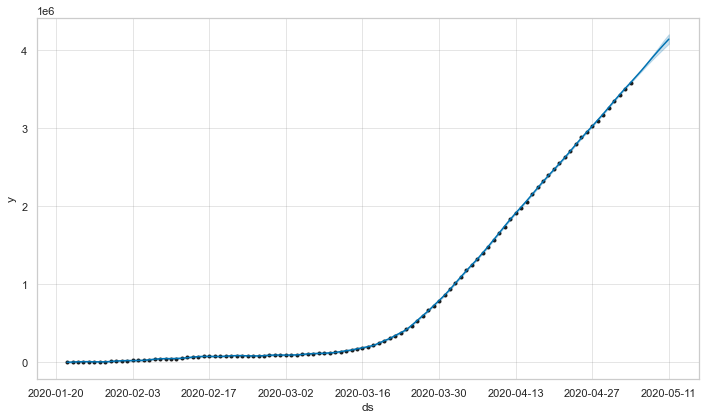

In [89]:
predicted_cases = case_model.plot(case_forecast)

/anaconda3/lib/python3.7/site-packages/fbprophet/forecaster.py:400: FutureWarning:

The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.



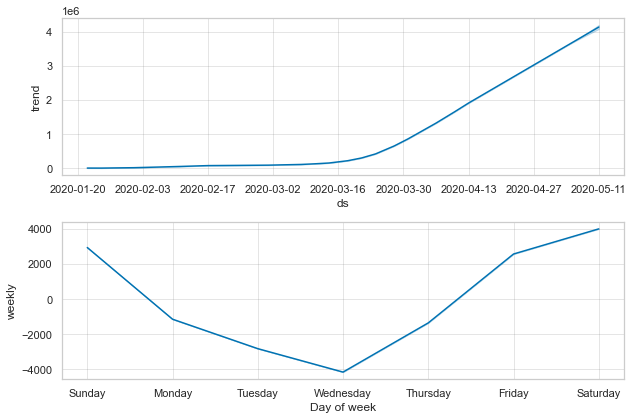

In [90]:
predicted_cases = case_model.plot_components(case_forecast)

In [91]:
from fbprophet.plot import plot_plotly
import plotly.offline as pa
pa.init_notebook_mode()

fig = plot_plotly(case_model, case_forecast)  # This returns a plotly Figure
pa.iplot(fig)

In [92]:
deaths_model = Prophet(interval_width=0.95)
deaths_model.fit(global_deaths)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/anaconda3/lib/python3.7/site-packages/fbprophet/forecaster.py:400: FutureWarning:

The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.



In [93]:
predict_dates = deaths_model.make_future_dataframe(periods=7)
# predict_dates.tail()

In [94]:
deaths_forecast = deaths_model.predict(predict_dates)
deaths_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
106,2020-05-07,276114.883359,273549.814161,279064.799368
107,2020-05-08,282450.963450,279407.243265,285817.193780
108,2020-05-09,288485.414409,284776.936192,292283.262826
109,2020-05-10,293900.231332,289889.395906,298712.672723
110,2020-05-11,299550.270468,294371.162055,305538.803149


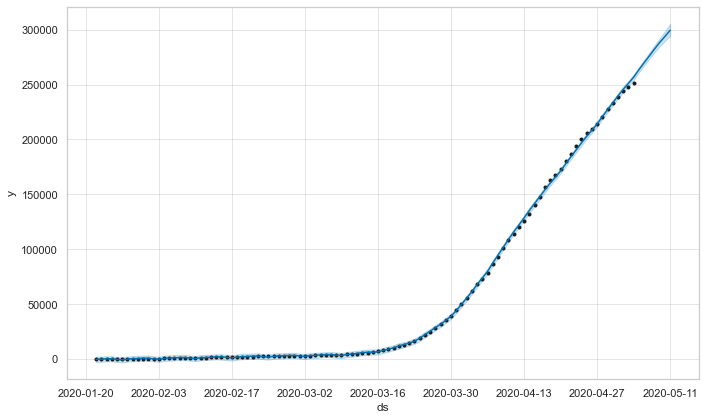

In [95]:
deaths_forecast_fig = deaths_model.plot(deaths_forecast)

/anaconda3/lib/python3.7/site-packages/fbprophet/forecaster.py:400: FutureWarning:

The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.



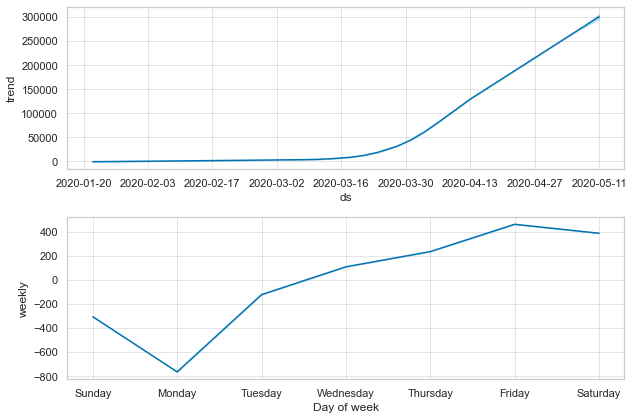

In [96]:
deaths_forecast_fig = deaths_model.plot_components(deaths_forecast)

In [97]:
from fbprophet.plot import plot_plotly
import plotly.offline as pa
pa.init_notebook_mode()

fig = plot_plotly(deaths_model, deaths_forecast)  # This returns a plotly Figure
pa.iplot(fig)

In [98]:
recovered_model = Prophet(interval_width=0.95)
recovered_model.fit(global_recovered)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/anaconda3/lib/python3.7/site-packages/fbprophet/forecaster.py:400: FutureWarning:

The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.



In [99]:
predict_dates = recovered_model.make_future_dataframe(periods=7)
# predict_dates.tail()

In [100]:
recovered_forecast = recovered_model.predict(predict_dates)
recovered_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
106,2020-05-07,1.232111e+06,1.213752e+06,1.250758e+06
107,2020-05-08,1.266506e+06,1.246281e+06,1.287811e+06
108,2020-05-09,1.299985e+06,1.277493e+06,1.323727e+06
109,2020-05-10,1.332145e+06,1.308024e+06,1.357353e+06
110,2020-05-11,1.364612e+06,1.336570e+06,1.393292e+06


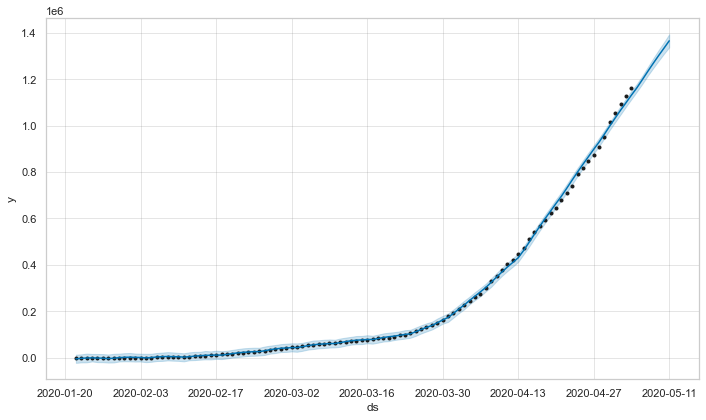

In [101]:
recovered_forecast_fig = recovered_model.plot(recovered_forecast)

/anaconda3/lib/python3.7/site-packages/fbprophet/forecaster.py:400: FutureWarning:

The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.



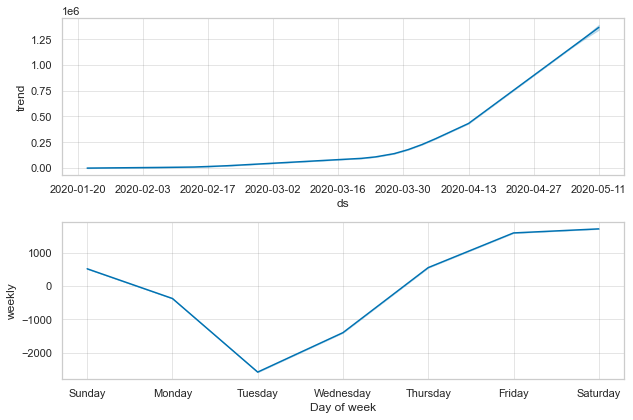

In [102]:
recovered_forecast_fig = recovered_model.plot_components(recovered_forecast)

In [103]:
from fbprophet.plot import plot_plotly
import plotly.offline as pa
pa.init_notebook_mode()

fig = plot_plotly(recovered_model, recovered_forecast)  # This returns a plotly Figure
pa.iplot(fig)